# HW03 (due October 12th)

# Load Data

In [2]:
// Load the NLSY dataset
webuse nlswork

(National Longitudinal Survey.  Young Women 14-26 years of age in 1968)


#  Summary statistics

In [3]:
// Summarize the dataset
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      idcode |     28,534    2601.284    1487.359          1       5159
        year |     28,534    77.95865    6.383879         68         88
    birth_yr |     28,534    48.08509    3.012837         41         54
         age |     28,510    29.04511    6.700584         14         46
        race |     28,534    1.303392    .4822773          1          3
-------------+---------------------------------------------------------
         msp |     28,518    .6029175    .4893019          0          1
     nev_mar |     28,518    .2296795    .4206341          0          1
       grade |     28,532    12.53259    2.323905          0         18
    collgrad |     28,534    .1680451    .3739129          0          1
    not_smsa |     28,526    .2824441    .4501961          0          1
-------------+-------------------------------------------------

In [4]:
// tabulate college and union status
tabulate collgrad union 


      1 if |
   college |      1 if union
  graduate |         0          1 |     Total
-----------+----------------------+----------
         0 |    12,067      3,413 |    15,480 
         1 |     2,661      1,097 |     3,758 
-----------+----------------------+----------
     Total |    14,728      4,510 |    19,238 


In [5]:
// generate a variable for log hours worked
generate log_hours = log(hours)

(67 missing values generated)


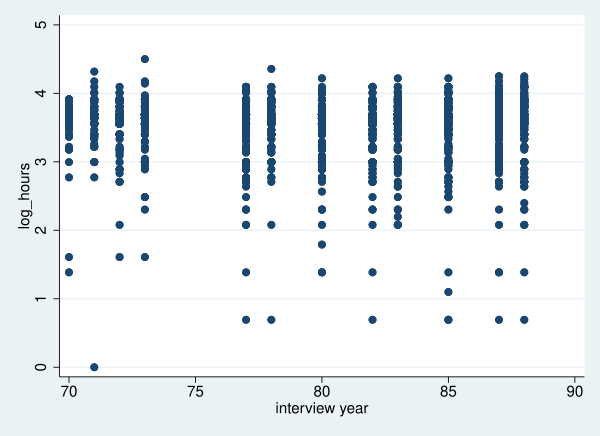

In [6]:
// plot log hours against year separately for union and non-union
graph twoway scatter log_hours year if union == 0
graph twoway scatter log_hours year if union == 1

# Regression: Effect of union status on hours worked

In [7]:
// Regress hours worked against union status
regress hours union


      Source |       SS           df       MS      Number of obs   =    19,202
-------------+----------------------------------   F(1, 19200)     =    136.64
       Model |   12451.759         1   12451.759   Prob > F        =    0.0000
    Residual |  1749668.94    19,200  91.1285905   R-squared       =    0.0071
-------------+----------------------------------   Adj R-squared   =    0.0070
       Total |   1762120.7    19,201  91.7723398   Root MSE        =    9.5461

------------------------------------------------------------------------------
       hours |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       union |   1.900613   .1625944    11.69   0.000     1.581914    2.219312
       _cons |   36.31125   .0787378   461.17   0.000     36.15691    36.46558
------------------------------------------------------------------------------


In [ ]:
// What is the identification assumption for the coefficient on union to be causal?
// There are no omitted variables. Hours worked is exogenous of union status. 

In [8]:
// Regress hours worked against college graduate with individual (idcode) and year fixed effects
reghdfe hours union, absorb(idcode year)

// What is the identification assumption for the coefficient on union to be causal?
// Union is endogenous of the fixed effects. Cannot infer causality without controlling for fixed effects. 

(dropped 667 singleton observations)
(MWFE estimator converged in 7 iterations)

HDFE Linear regression                            Number of obs   =     18,535
Absorbing 2 HDFE groups                           F(   1,  15040) =      61.53
                                                  Prob > F        =     0.0000
                                                  R-squared       =     0.5314
                                                  Adj R-squared   =     0.4226
                                                  Within R-sq.    =     0.0041
                                                  Root MSE        =     7.1935

------------------------------------------------------------------------------
       hours |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       union |    1.53156   .1952513     7.84   0.000     1.148843    1.914276
       _cons |   36.45337   .0702729   518.74   0

In [11]:
// Now cluster standard errors. What level should you cluster at and why?
// What do you notice about the coefficients?
reghdfe hours union, absorb(idcode year) cluster(year)
// Standard error seems to decrease when clustering by year

(dropped 667 singleton observations)
(MWFE estimator converged in 7 iterations)

HDFE Linear regression                            Number of obs   =     18,535
Absorbing 2 HDFE groups                           F(   1,     11) =     112.84
Statistics robust to heteroskedasticity           Prob > F        =     0.0000
                                                  R-squared       =     0.5314
                                                  Adj R-squared   =     0.4226
                                                  Within R-sq.    =     0.0041
Number of clusters (year)    =         12         Root MSE        =     7.1935

                                  (Std. Err. adjusted for 12 clusters in year)
------------------------------------------------------------------------------
             |               Robust
       hours |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       union 

In [12]:
// Now add fixed effects for occupation code
// In terms of causal inference, why is adding occupation code 
// as a control probably not a good idea?
reghdfe hours union, absorb(idcode year occ_code)

// Occupation could be determined by the union variable and also correlated with the hours worked. It is a collider.

(dropped 666 singleton observations)
(MWFE estimator converged in 16 iterations)

HDFE Linear regression                            Number of obs   =     18,463
Absorbing 3 HDFE groups                           F(   1,  14963) =      42.50
                                                  Prob > F        =     0.0000
                                                  R-squared       =     0.5445
                                                  Adj R-squared   =     0.4380
                                                  Within R-sq.    =     0.0028
                                                  Root MSE        =     7.0947

------------------------------------------------------------------------------
       hours |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       union |   1.267841   .1944782     6.52   0.000     .8866401    1.649042
       _cons |   36.52061   .0696974   523.99   

In [13]:
// What are "good controls" in the dataset in terms of being exogenous to union status?
// add them to the regression, interacted with year, using this syntax:
// absorb( ... year##c.(var1 var2 ...))
// how do these change your estimates?
reghdfe hours union, absorb(year##c.(age race c_city))
// some of the variable names are not clear...

(MWFE estimator converged in 1 iterations)

HDFE Linear regression                            Number of obs   =     19,191
Absorbing 1 HDFE group                            F(   1,  19142) =     119.27
                                                  Prob > F        =     0.0000
                                                  R-squared       =     0.0227
                                                  Adj R-squared   =     0.0202
                                                  Within R-sq.    =     0.0062
                                                  Root MSE        =     9.4815

------------------------------------------------------------------------------
       hours |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
       union |   1.780756   .1630535    10.92   0.000     1.461157    2.100355
       _cons |   36.33694   .0783895   463.54   0.000     36.18329    36.49059
-------

# Short Essay: Correlation/Causation

**Find a news article mistaking correlation for causation. Link to the article and write a short paragraph explaining the mistake.**

[type your comments here, or attach as separate document.]

In [ ]:
https://tinyurl.com/y6jtqf9x

The link between vitamin D deficiency and COVID mobidity and risk of infection have been widely circulating since early September.
While recent research does demonstrate that there is likely a causal relationship, I selected an early article that reports misleading statistics of COVID testing outcomes as caused by vitamin D defiency. 
The article quotes: "vitamin D deficiency increases a person's risk for catching COVID-19 by a whopping 77% compared to those who have sufficient levels of the nutrient".

It should be noted that the article failed to consider:
    * People who are susceptible to vitamin D deficiency are typically those who are Black, elderly, and others with underlying conditions. 
      These happen to be the same groups of people with higher rates of infection and death due to socioeconomic and preexisting health factors.
    * The original study used historical vitamin D testing results (from up to a year prior). This may not reflect accurately as the patient's vitamin D levels after infection. 
      Additionally, vitamin D testing is a specialized test, so it raises questions about selection bias in the patients involved in the study.
    
In summary, while a relationshp between vitamin D levels and COVID infection outcomes may be true, the article presents a misleading fact that vitamin D is responsible for a 77% reduction in COVID risks. 